In [6]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import pandas as pd
# from gptide import cov
from gptide import GPtideScipy
from gptide import stats as gpstats
from scipy import signal as sg
from s3fs import S3FileSystem, S3Map
import scipy
from scipy import stats
from scipy.special import kv as K_nu
from scipy.special import gamma
from scipy.optimize import minimize
# mle function import
from IPython.display import display, HTML
import importlib
display(HTML("<style>.container { width:80% !important; }</style>"))

In [7]:
plt.rcParams['axes.labelsize'] = 'medium'
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = [25, 10]
#np.set_printoptions(threshold=sys.maxsize)
plt.rcParams['animation.embed_limit'] = 2**128

# Import raw observation data and PSD processing

The raw observation data is extracted from IMOS open access ocean data at Australia NWS 400km offshore

In [10]:
# Login to the s3 bucket and list the deep water mooring (DWM) folders
fs = S3FileSystem(anon=True)
aodn = fs.ls('imos-data/IMOS/DWM/')

In [11]:
## Australia NWS
KIM200_temp_ncfiles_P1 = [
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120202T000001Z_KIM200_FV01_KIM200-1202-SBE37SM-RS232-24.5_END-20120809T040001Z_C-20171201T052403Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120202T120001Z_KIM200_FV01_KIM200-1202-SBE37SM-RS232-178.5_END-20120809T050301Z_C-20171201T052323Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120202T120001Z_KIM200_FV01_KIM200-1202-SBE37SM-RS232-44.5_END-20120809T040501Z_C-20171201T052356Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120202T120001Z_KIM200_FV01_KIM200-1202-SBE37SM-RS232-84.5_END-20120809T050701Z_C-20171201T052342Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE39-34.5_END-20120809T074800Z_C-20171201T052400Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE39-54.5_END-20120809T232200Z_C-20171201T052353Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE39-64.5_END-20120809T121600Z_C-20171201T052349Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE56-104.5_END-20120810T024659Z_C-20171201T052336Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE56-114.5_END-20120810T034357Z_C-20171201T052333Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE56-129.5_END-20120810T031059Z_C-20171201T052330Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE56-154.5_END-20120810T004759Z_C-20171201T052327Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE56-197.5_END-20120810T024359Z_C-20171201T052311Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120201T000000Z_KIM200_FV01_KIM200-1202-SBE56-74.5_END-20120810T034559Z_C-20171201T052346Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120202T000000Z_KIM200_FV01_KIM200-1202-SBE56-94.5_END-20120810T024359Z_C-20171201T052339Z.nc',
]

In [12]:
## Australia NWS
KIM200_temp_ncfiles_P2 = [
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120810T220001Z_KIM200_FV01_KIM200-1208-SBE37SM-RS232-178_END-20130131T025401Z_C-20171201T064233Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120810T220001Z_KIM200_FV01_KIM200-1208-SBE37SM-RS232-25_END-20130131T015401Z_C-20171201T064312Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120810T220001Z_KIM200_FV01_KIM200-1208-SBE37SM-RS232-43_END-20130131T032801Z_C-20171201T064305Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20120810T220001Z_KIM200_FV01_KIM200-1208-SBE37SM-RS232-83_END-20130131T013601Z_C-20171201T064252Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-113_END-20130126T101408Z_C-20171201T064243Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-128_END-20130126T110819Z_C-20171201T064239Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-153_END-20130126T101139Z_C-20171201T064236Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-198_END-20130126T091458Z_C-20171201T064220Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-53_END-20130126T091042Z_C-20171201T064302Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-73_END-20130126T101612Z_C-20171201T064256Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T000000Z_KIM200_FV01_KIM200-1208-SBE56-93_END-20130126T110229Z_C-20171201T064249Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120806T011856Z_KIM200_FV01_KIM200-1208-SBE56-103_END-20130126T091236Z_C-20171201T064246Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120810T220000Z_KIM200_FV01_KIM200-1208-SBE39-33_END-20130127T051200Z_C-20171201T064309Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20120810T220000Z_KIM200_FV01_KIM200-1208-SBE39-63_END-20130127T053200Z_C-20171201T064259Z.nc',
]

In [13]:
KIM200_temp_ncfiles_P3 = [
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130124T000001Z_KIM200_FV01_KIM200-1301-SBE37SM-RS232-184_END-20130723T025401Z_C-20171204T015851Z.nc',
# 'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130126T000001Z_KIM200_FV01_KIM200-1301-SBE37-SM-31_END-20130607T092801Z_C-20171204T015930Z.nc',
# 'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130126T000001Z_KIM200_FV01_KIM200-1301-SBE37-SM-49_END-20130607T092800Z_C-20171204T015923Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130126T000001Z_KIM200_FV01_KIM200-1301-SBE37SM-RS232-89_END-20130723T032401Z_C-20171204T015910Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-109_END-20130722T072139Z_C-20171204T015904Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-119_END-20130722T071049Z_C-20171204T015901Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-134_END-20130722T075909Z_C-20171204T015857Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-159_END-20130722T082819Z_C-20171204T015854Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-204_END-20130722T072409Z_C-20171204T015838Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-59_END-20130722T065549Z_C-20171204T015919Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-79_END-20130722T085729Z_C-20171204T015913Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130124T000000Z_KIM200_FV01_KIM200-1301-SBE56-99_END-20130722T084319Z_C-20171204T015907Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130125T000000Z_KIM200_FV01_KIM200-1301-SBE39-39_END-20130723T050800Z_C-20171204T015926Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130125T000000Z_KIM200_FV01_KIM200-1301-SBE39-69_END-20130723T041000Z_C-20171204T015916Z.nc',
]

In [14]:
KIM200_temp_ncfiles_P4 = [
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130724T120001Z_KIM200_FV01_KIM200-1307-SBE37SM-RS232-183.3_END-20140201T094001Z_C-20171204T034246Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130724T120001Z_KIM200_FV01_KIM200-1307-SBE37SM-RS232-30.3_END-20140201T110801Z_C-20171204T034322Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130724T120001Z_KIM200_FV01_KIM200-1307-SBE37SM-RS232-48.3_END-20140201T095401Z_C-20171204T034315Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20130724T120001Z_KIM200_FV01_KIM200-1307-SBE37SM-RS232-88.3_END-20140130T054901Z_C-20171204T034303Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130724T000000Z_KIM200_FV01_KIM200-1307-SBE39-38.3_END-20140201T110600Z_C-20171204T034319Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130724T000000Z_KIM200_FV01_KIM200-1307-SBE39-68.3_END-20140201T111200Z_C-20171204T034309Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130724T000000Z_KIM200_FV01_KIM200-1307-SBE56-108.3_END-20140130T020924Z_C-20171204T034258Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130724T000000Z_KIM200_FV01_KIM200-1307-SBE56-58.3_END-20140130T014143Z_C-20171204T034313Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130724T000000Z_KIM200_FV01_KIM200-1307-SBE56-78.3_END-20140130T055409Z_C-20171204T034307Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130724T000000Z_KIM200_FV01_KIM200-1307-SBE56-98.3_END-20140130T020022Z_C-20171204T034301Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130725T000000Z_KIM200_FV01_KIM200-1307-SBE56-118.3_END-20140130T025049Z_C-20171204T034255Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130725T000000Z_KIM200_FV01_KIM200-1307-SBE56-133.3_END-20140130T025729Z_C-20171204T034252Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130725T000000Z_KIM200_FV01_KIM200-1307-SBE56-158.3_END-20140130T021819Z_C-20171204T034249Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20130725T000000Z_KIM200_FV01_KIM200-1307-SBE56-203.3_END-20140130T022409Z_C-20171204T034233Z.nc',

]

In [15]:
KIM200_temp_ncfiles_P5 = [
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20140131T000001Z_KIM200_FV01_KIM200-1401-SBE37SM-RS232-183_END-20140827T062501Z_C-20171204T044059Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20140131T000001Z_KIM200_FV01_KIM200-1401-SBE37SM-RS232-30_END-20140827T065001Z_C-20171204T044137Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20140131T000001Z_KIM200_FV01_KIM200-1401-SBE37SM-RS232-48_END-20140827T060001Z_C-20171204T044131Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/CTD_timeseries/IMOS_ANMN-QLD_CSTZ_20140131T000001Z_KIM200_FV01_KIM200-1401-SBE37SM-RS232-88_END-20140827T080501Z_C-20171204T044118Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140111T000000Z_KIM200_FV01_KIM200-1401-SBE56-58_END-20140827T042459Z_C-20171204T044128Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-108_END-20140827T070329Z_C-20171204T044112Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-118_END-20140827T101759Z_C-20171204T044109Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-133_END-20140827T102829Z_C-20171204T044106Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-158_END-20140827T120959Z_C-20171204T044102Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-203_END-20140827T121859Z_C-20171204T044045Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-78_END-20140827T060259Z_C-20171204T044121Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140115T000000Z_KIM200_FV01_KIM200-1401-SBE56-98_END-20140827T065143Z_C-20171204T044115Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140130T000000Z_KIM200_FV01_KIM200-1401-SBE39-38_END-20140827T051959Z_C-20171204T044134Z.nc',
'imos-data/IMOS/ANMN/QLD/KIM200/Temperature/IMOS_ANMN-QLD_TZ_20140130T000000Z_KIM200_FV01_KIM200-1401-SBE39-68_END-20140827T054000Z_C-20171204T044125Z.nc',
]

In [16]:
KIM200_temp_ncfiles = [KIM200_temp_ncfiles_P1,KIM200_temp_ncfiles_P2,KIM200_temp_ncfiles_P3,
                       KIM200_temp_ncfiles_P4,KIM200_temp_ncfiles_P5]

## Show an example

In [18]:
from functions import Processing
from speccy import sick_tricks as gary

In [19]:
sitename = 'KIM200'
# for example: choose a depth to perform analysis
example_ds = Processing.Open_file_nocache(KIM200_temp_ncfiles_P5[6], fs)
example_ds.load()
# example_ds

C:\Users\21924032\Anaconda3\lib\site-packages\xarray\backends\plugins.py:80: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


<xarray.Dataset> Size: 16MB
Dimensions:                (TIME: 646357)
Coordinates:
  * TIME                   (TIME) datetime64[ns] 5MB 2014-01-15 ... 2014-08-2...
    LATITUDE               float64 8B -15.53
    LONGITUDE              float64 8B 121.2
    NOMINAL_DEPTH          float32 4B 118.0
Data variables:
    TIMESERIES             int32 4B 1
    TEMP                   (TIME) float32 3MB 24.07 24.07 24.08 ... 23.04 23.07
    TEMP_quality_control   (TIME) float32 3MB 4.0 4.0 4.0 4.0 ... 4.0 4.0 4.0
    DEPTH                  (TIME) float32 3MB nan nan nan nan ... nan nan nan
    DEPTH_quality_control  (TIME) float32 3MB 4.0 4.0 4.0 4.0 ... 4.0 4.0 4.0
Attributes: (12/59)
    abstract:                         The Queensland and Northern Australia m...
    acknowledgement:                  Any users of IMOS data are required to ...
    author:                           Australian Institute of Marine Science
    author_email:                     adc@aims.gov.au
    cdm_data_type:                    Station
    citation:                         The citation in a list of references is...
    ...                               ...
    toolbox_input_file:               /export/imos/Processed/KIM/KIM200/KIM20...
    toolbox_version:                  2.5.36 - GLNXA64
    compliance_checks_passed:         cf imos:1.4
    compliance_checker_version:       2.3.1
    compliance_checker_imos_version:  1.1.3
    history:                          2017-12-04T04:45:50Z - depthPP: Depth i...

In [20]:
# Calculate the Coriolis frequency
lat = example_ds.LATITUDE.values
lon = example_ds.LONGITUDE.values
f_coriolis = 4*np.pi/86400 * np.sin(lat*np.pi/180)
f_coriolis_cpd = np.abs(f_coriolis*86400/(2*np.pi))
print('Coriolis frequency is',f_coriolis_cpd, 'cpd')
print(lat,lon)
#Principal lunar semidiurnal
M2_freq = 0.0805*24 #cpd
M4_freq = 2*M2_freq
#Lunar elliptic semidiurnal
N2_freq = 0.0790*24 #cpd
#Princinpal lunar diurnal
O1_freq = 0.0387*24 #cpd
#Lunisolar diurnal
K1_freq = 0.0418*24 #cpd
#Principal solar semidiurnal
S2_freq = 0.0833*24 #cpd
xcoords = [f_coriolis_cpd,  K1_freq,O1_freq,M2_freq,S2_freq]
xcoords_label = ['Coriolis_freq', 'K1', 'O1','M2','S2']
xcoords_color = ['orange', 'c', 'm','r','b','g']

Coriolis frequency is 0.535637693886877 cpd
-15.5345166667 121.2432166667


## Grid and Windowing the temp data 

In [22]:
# Period 1
importlib.reload(Processing)
Depth_dict_whole = {}
Temp_dict_whole = {}
Temp_anomaly_dict_whole = {}
Temp_time_dict_whole = {}
for order, temp_ncfiles in enumerate(KIM200_temp_ncfiles):
    Depth_dict, Temp_dict, Temp_anomaly_dict, Temp_time_dict = Processing.Collect_temp(temp_ncfiles,'KIM200',order+1)
    Temp_dict_whole.update(Temp_dict)
    Temp_anomaly_dict_whole.update(Temp_anomaly_dict)
    Temp_time_dict_whole.update(Temp_time_dict)

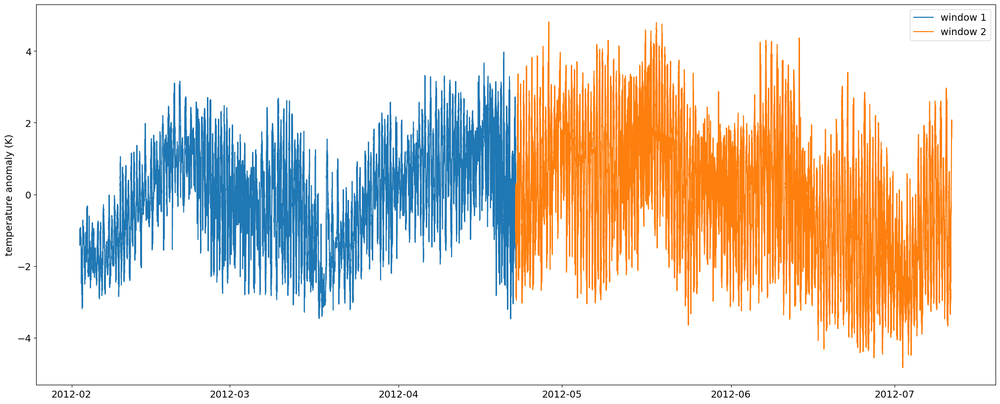

In [23]:
#plot example
plt.plot(Temp_anomaly_dict_whole['KIM200_P1_178.5_0'].TIME,Temp_anomaly_dict_whole['KIM200_P1_178.5_0'],label='window 1')
plt.plot(Temp_anomaly_dict_whole['KIM200_P1_178.5_1'].TIME,Temp_anomaly_dict_whole['KIM200_P1_178.5_1'],label='window 2')
plt.ylabel('temperature anomaly (K)')
plt.legend()

## Collect the obs information 

In [25]:
importlib.reload(Processing)
Time_summary_dict = Processing.Collect_time_info(Temp_time_dict_whole)

In [26]:
importlib.reload(Processing)
Avg_temp_dict = Processing.Find_mean_temp(Temp_time_dict_whole,Temp_dict_whole)

# Using harmonic analysis as the mean function

In [28]:
from functions import Harmonics

In [29]:
importlib.reload(Harmonics)
Whole_Mean_params_dict,Whole_Yd_mean_dict,Whole_ϵ_dict,\
Whole_F_ϵ_dict,Whole_Puu_ϵ_raw_dict,Whole_HA_var_dict = Harmonics.Cal_HA(Temp_time_dict_whole, Temp_anomaly_dict_whole)
#cal tidal mean
HA_var_D1_dict, HA_var_D2_dict = Harmonics.Cal_HA_var_for_tidal(Whole_Mean_params_dict)

## Scaling the periodogram similar to Parzen1996

In [31]:
#scaling
Whole_Puu_ϵ_dict = Processing.Scale_periodogram(Temp_dict_whole,Whole_Puu_ε_raw_dict)

## Show an example of harmonic analysis

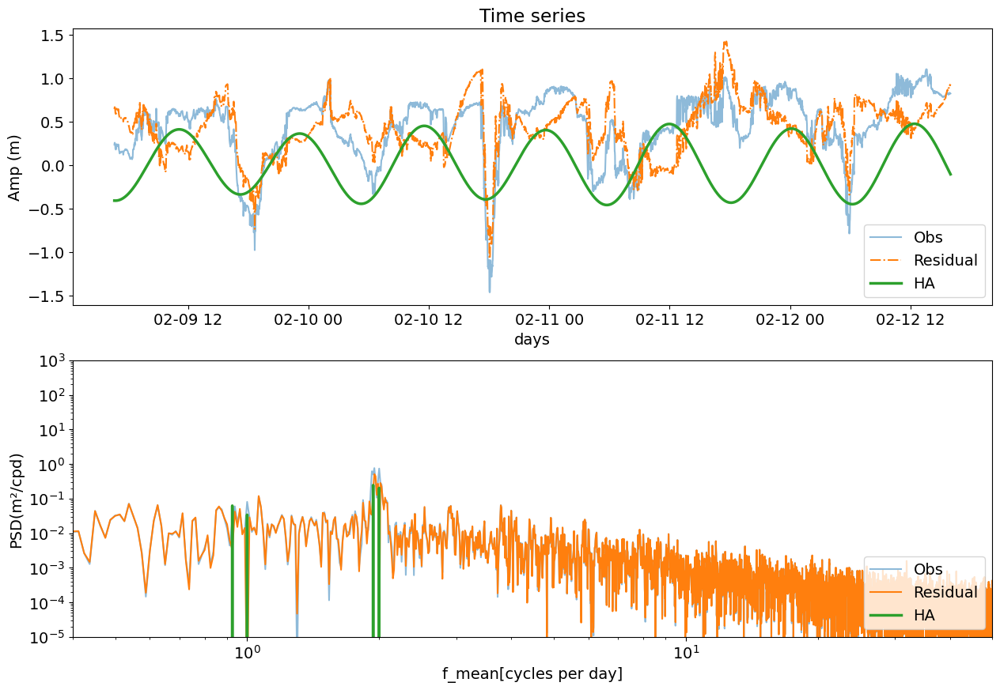

In [33]:
from functions import Plot_figure
importlib.reload(Plot_figure)
importlib.reload(Processing)
example_name = 'KIM200_P1_24.5_0'
plt.rcParams['figure.figsize'] = [15, 10]
Plot_figure.Plot_HA_result(Temp_time_dict_whole[example_name],Temp_anomaly_dict_whole[example_name],xcoords,
                           Whole_Mean_params_dict[example_name],Whole_ϵ_dict[example_name],Whole_Yd_mean_dict[example_name],
                           Whole_F_ϵ_dict[example_name],Whole_Puu_ϵ_dict[example_name],)

# Specify the horizontal domain, bathymetry section and vertical density profile

In [35]:
from functions import Bathmetry

In [36]:
bathy_params = [400,200,75e3, 70e3] #set 3
N = 16000  # Number of grid points
dx = 25.  # horizontal grid spacing
# The horizontal domain
x = np.arange(0, N * dx, dx)
# The depth
h = Bathmetry.Depth_tanh(bathy_params, x)

In [37]:
# See the references above for the mean of the,
#set 1
rho_params =[1025.66780468, # Mean density,             beta0
     1.5, # Density jump,                        beta1
     150,# Depth of the second pycnocline      beta4
     50, # Width of the second pycnocline     beta5
        ]
# Number of vertical levels
Nz = 40
z = np.arange(-400,1,10)
rhoz = Bathmetry.Single_tanh(z,rho_params)

Text(0.5, 1.0, 'Stratification')

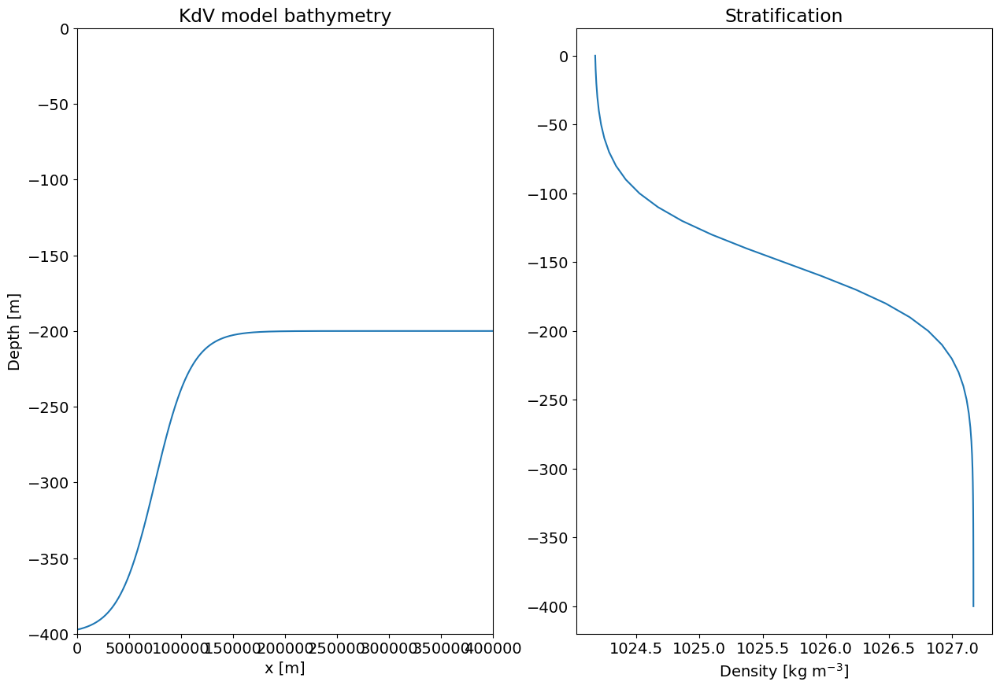

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.plot(x, -h)  #negative bc depth
ax1.set_title('KdV model bathymetry')
ax1.set_ylabel('Depth [m]')
ax1.set_xlabel('x [m]')
#plt.ylim(-H, 0)
ax1.set_ylim(-bathy_params[0], 0)
ax1.set_xlim(0, dx * N)

ax2.plot(rhoz, z)
# plt.xticks(np.arange(min(rhoz), max(rhoz), 0.5))
# ax2.set_ylabel('Depth [m]')
ax2.set_xlabel('Density [kg m$^{-3}$]')
ax2.set_title('Stratification')
# ax2.xaxis.tick_top()

## From the vertical density profile to find the vertical structure

(array([0.        , 0.07687536, 0.15373435, 0.23054468, 0.30724678,
        0.38373557, 0.45983197, 0.53524007, 0.60948584, 0.681836  ,
        0.75120433, 0.81607009, 0.87446053, 0.92407239, 0.9625925 ,
        0.98818855, 1.        , 0.99838514, 0.98478656, 0.96130184,
        0.93018943, 0.89350164, 0.85290635, 0.80965839, 0.76465216,
        0.71850136, 0.67161585, 0.62426405, 0.57661921, 0.52879187,
        0.4808519 , 0.43284309, 0.38479268, 0.33671745, 0.28862765,
        0.24052946, 0.1924266 , 0.14432123, 0.09621459, 0.04810739,
        0.        ]),
 1.4287273869388712,
 210.49639758034337,
 array([   0.,  -10.,  -20.,  -30.,  -40.,  -50.,  -60.,  -70.,  -80.,
         -90., -100., -110., -120., -130., -140., -150., -160., -170.,
        -180., -190., -200., -210., -220., -230., -240., -250., -260.,
        -270., -280., -290., -300., -310., -320., -330., -340., -350.,
        -360., -370., -380., -390., -400.]))

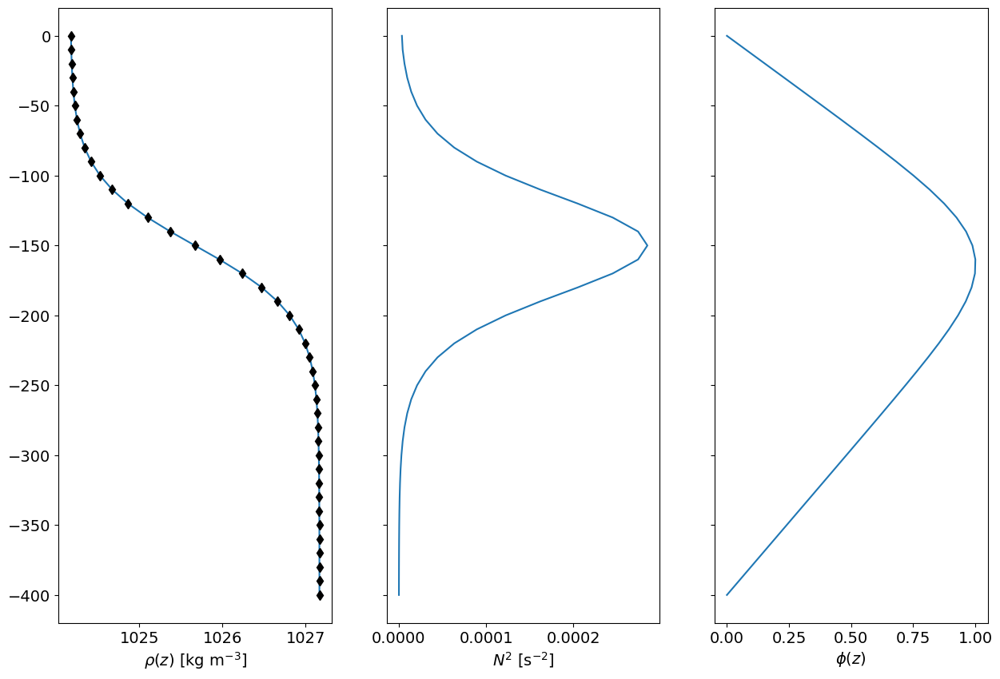

In [40]:
import iwaves
WaveModes = iwaves.IWaveModes(rhoz,z,density_func='single_tanh_rho')
zmax = -np.max(np.abs(z))
dz = z[1]-z[0]
phi_1, c1, h_e, Z = WaveModes(zmax,dz,mode=0)  # mode 1
iwaves.IWaveModes.plot_modes(WaveModes)
phi_1, c1, h_e,Z

In [41]:
phi_depth_profile = xr.DataArray(phi_1, coords={'depth': Z}, dims=['depth'])

## Garret-Munk Spectral Model

In [43]:
# Garret-Munk 
from functions import GM81 as gm
# Coriolis frequency
f = f_coriolis_cpd/86400 #hz
# buoyancy frequency (corresponding to 1000 m depth)
buoyancy_freq = 200
N = buoyancy_freq/86400  #hz
# surface-extrapolated buoyancy frequency
N0 = np.sqrt(WaveModes.N2)[0] #hz
# e-folding scale of N(z) # how long N(z) take to increase by e
b = 1300#m
# frequency
omg = np.linspace(1.01*f, N, len(Whole_F_ε_dict[example_name]))
# mode number
j = np.arange(1, 100)
# reshape to allow multiplication into 2D array
Omg = np.reshape(omg, (omg.size,1))
J = np.reshape(j, (1,j.size))
# frequency spectra (KE and PE)
K_omg_j = gm.K_omg_j(Omg, J, f, N, N0, b)
P_omg_j = gm.P_omg_j(Omg, J, f, N, N0, b)
# sum over modes
K_omg = np.sum(K_omg_j, axis=1)
P_omg = np.sum(P_omg_j, axis=1)
GM_spectrum = P_omg  #(m^2/s^2/cps)
P_omg

array([3.03413116e+03, 3.82558493e+03, 4.43662836e+03, ...,
       1.58165310e-01, 1.58159833e-01, 1.58154356e-01])

# Optimizing params for the residual function -- Whittle likelihood

Fitting in frequency domain using Whittle likelihood

$$
ℓ_W(\theta) = -\sum\limits _{\omega\in\Omega}\begin{Bmatrix}\log\hat{f}(\omega;\theta)+\frac{I(\omega)}{\hat{f}(\omega;\theta)}\end{Bmatrix}  
$$

where $\hat{f}(\omega;\theta)$ is the continuous-time process spectral density (what we expected)  and $I(\omega)$ is the periodogram (what we observed)

In [46]:
from functions import Cov
from functions import Optimisation

## Select Frequency range to omit the influence of inertial and M4 peak 

Generally, the Whittle likelihood is applied to optimize the parameters for the whole frequency band of the observed periodogram (an estimation of the true spectrum). However, in our case, we selected a range of frequencies (from coriolis frequency to buoyancy frequency) to perform the optimization because the internal tide behaviors appear in this bandwidth. In addition, since the inertial and M4 peak are not the characteristics of the internal tides, they are omitted in our optimization using Whittle likelihood.

In [49]:
#subset for modelling
subset_end_freq = 35 #cpd
peak_bandwidth = 0.1#cpd
M4_freq = 2*0.0805*24 #cpd
M6_freq = 3*0.0805*24 #cpd
D1_freq = 1 #cpd

Subset_dict, F_ε_subset_dict, Puu_ε_subset_dict = Processing.Subset_freq(Whole_F_ε_dict,Whole_Puu_ε_dict, 
                                                                         f_coriolis_cpd, subset_end_freq, peak_bandwidth, 
                                                                         Omit=True,omit_freq=(D1_freq,M4_freq,M6_freq))

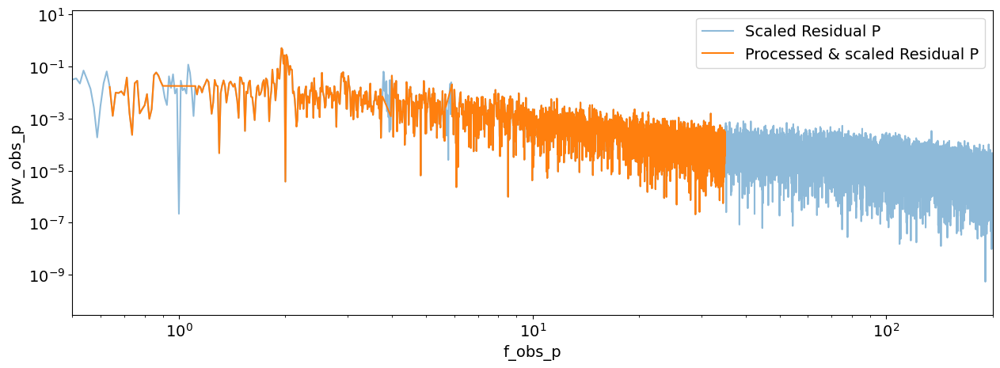

In [50]:
# show an example
plt.rcParams['figure.figsize'] = [15, 5]
plt.plot(Whole_F_ϵ_dict[example_name],Whole_Puu_ϵ_dict[example_name],alpha=0.5,label='Scaled Residual P')
plt.plot(F_ε_subset_dict[example_name],Puu_ε_subset_dict[example_name],label='Processed & scaled Residual P')
plt.legend()
plt.xlim(0.5, 200)
plt.ylabel('pvv_obs_p')
plt.xlabel('f_obs_p')
plt.xscale("log")
plt.yscale("log")

## Compute the signal variance

In [52]:
importlib.reload(Harmonics)
importlib.reload(Processing)
cutoff_freq = f_coriolis_cpd/86400
Temp_anomaly_subtidal_dict_whole = Processing.Find_subtidal_signal(Temp_anomaly_dict_whole,cutoff_freq)
Var_total_dict,Var_subtidal_dict,Var_ε_dict = Processing.Collect_var_info(Temp_anomaly_dict_whole,Temp_anomaly_subtidal_dict_whole,
                                                                          F_ε_subset_dict, Puu_ε_subset_dict)

In [53]:
from speccy import sick_tricks as gary
#show an example
print('total var is',Var_total_dict[example_name])
print('modulated+HA+subtidal:',Var_subtidal_dict[example_name]+Var_ε_dict[example_name]+Whole_HA_var_dict[example_name])

total var is 0.49717044830322266
modulated+HA+subtidal: 0.4539228422883337


## M1L2 Kernal

In [55]:
def M1L2(dx,params):

    S2_freq = 1.93 #cpd
    M2_freq = 2 #cpd
    
#     noise_var = params[0]
    η_matern1 = params[0]
    α_matern1 = params[1]
    eta_S2    = params[2]
    tau_S2    = params[3]
    eta_M2    = params[4]
    tau_M2    = params[5]
    
    matern1 = Cov.Matern(dx, (η_matern1,α_matern1),lmbda=3,sigma=1e-6)              #background energy continuum  
    peak2 = Cov.LR(dx,(eta_S2,tau_S2),l_cos=S2_freq) + Cov.LR(dx,(eta_M2,tau_M2),l_cos=M2_freq)
    COV = matern1 + peak2 #+ noise
    return COV

def M1L2_2(dx,params):
    S2_freq = 1.93 #cpd
    M2_freq = 2 #cpd

    η_matern1 = params[0]
    α_matern1 = params[1]
    eta_S2    = params[2]
    tau_S2    = params[3]
    gamma_S2  = params[4]
    eta_M2    = params[5]
    tau_M2    = params[6]
    gamma_M2  = params[7]
    
    matern1 = Cov.Matern(dx, (η_matern1,α_matern1),lmbda=3,sigma=1e-6)              #background energy continuum  
    peak2   = Cov.LR_2(dx, (eta_S2,tau_S2,gamma_S2),l_cos=S2_freq) + Cov.LR_2(dx, (eta_M2,tau_M2,gamma_M2),l_cos=M2_freq)
    COV = matern1 + peak2 #+ noise
    return COV

In [56]:
def M1L1(dx,params):
    S2_freq = 1.93 #cpd
    M2_freq = 2 #cpd
    D2_freq = (S2_freq+M2_freq)/2
    
    η_matern1 = params[0]
    α_matern1 = params[1]
    eta_D2    = params[2]
    tau_D2    = params[3]
    gamma_D2  = params[4]
    
    matern1 = Cov.Matern(dx, (η_matern1,α_matern1),lmbda=3,sigma=1e-6)              #background energy continuum  
    peak2   = Cov.LR_2(dx, (eta_D2,tau_D2,gamma_D2),l_cos=D2_freq) 
    COV = matern1 + peak2 #+ noise
    return COV

In [57]:
#Initia guess
IG_noise = 1.5e-5
IG_η_matern = 0.5
IG_α_matern = 1 #impact the slope
IG_eta   = 0.4
IG_tau   = 3 #impact how wide the broadening of peak 1 is (proportional)
IG_gamma = 1
Bound_gamma = [0,2]
#Initia guess
M1L2_covparams_ic =[IG_η_matern,
                    IG_α_matern,
                    IG_eta,
                    IG_tau,  
                    IG_gamma,
                    IG_eta,
                    IG_tau,
                    IG_gamma ]#Semi-Diurnal frequency              

M1L2_2_parameter_name = ['η_c','α_c','η_S2','τ_S2','γ_S2','η_M2', 'τ_M2','γ_M2']

In [58]:
#Initia guess
M1L1_covparams_ic =[IG_η_matern,
                    IG_α_matern,
                    IG_eta,
                    IG_tau,  
                    IG_gamma, ]#Semi-Diurnal frequency                 

M1L1_parameter_name = ['η_c','α_c','η_D2','τ_D2','γ_D2',]

Run Model/

In [60]:
# %%time
# from functions import Optimisation
# importlib.reload(Cov)
# importlib.reload(Optimisation)
# F_model_fit_dict, P_model_fit_dict,Soln_model_fit_dict, Whittle_value_dict = Optimisation.Model_fit(Whole_Puu_ϵ_dict,Temp_time_dict_whole,Subset_dict,
#                                                                  M1L2_covparams_ic,M1L2_2)

In [61]:
%%time
from functions import Optimisation
importlib.reload(Cov)
importlib.reload(Optimisation)
F_model_fit_dict, P_model_fit_dict,Soln_model_fit_dict, Whittle_value_dict = Optimisation.Model_fit(Whole_Puu_ϵ_dict,Temp_time_dict_whole,Subset_dict,
                                                                                                    M1L1_covparams_ic,M1L1,
                                                                                                    bound_idx = -1, bounds = Bound_gamma)

C:\Users\21924032\GitHub\Yutao_PhD_codes\Aim1 1D Internal wave modeling\notebooks\1D internal tide temp model fit V1.7\functions\Cov.py:98: RuntimeWarning: divide by zero encountered in power
  K *= np.power(np.abs(lmbda * dx), nu)


CPU times: total: 2h 17min 17s
Wall time: 2h 17min 23s


In [62]:
Var_model_fit_dict = {}
for i in F_model_fit_dict:
    Var_model_fit_dict[i] = Processing.Calc_var_from_spectrum(F_model_fit_dict[i], P_model_fit_dict[i])
#put all var together    
Var_summary_dict = {'Whole_HA_var': Whole_HA_var_dict,'HA_D1_var': HA_var_D1_dict,'HA_D2_var': HA_var_D2_dict,
               'Var_total': Var_total_dict,'Var_subtidal': Var_subtidal_dict,'Var_ε': Var_ε_dict,
               'Var_model_fit':Var_model_fit_dict}    

## Show all Model fit results 

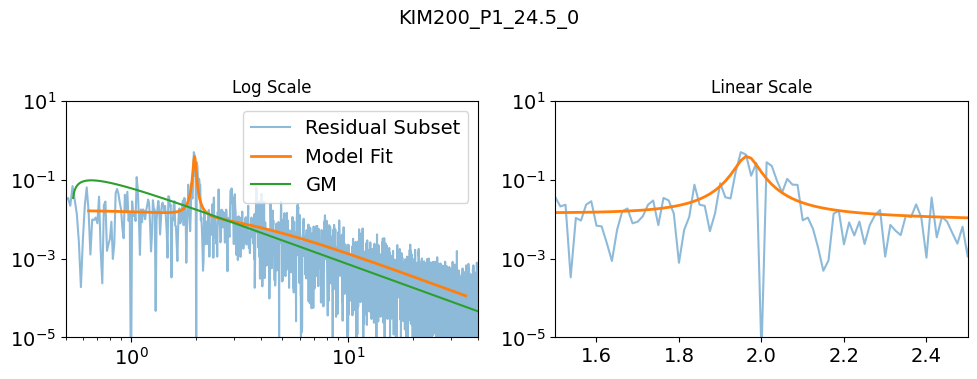

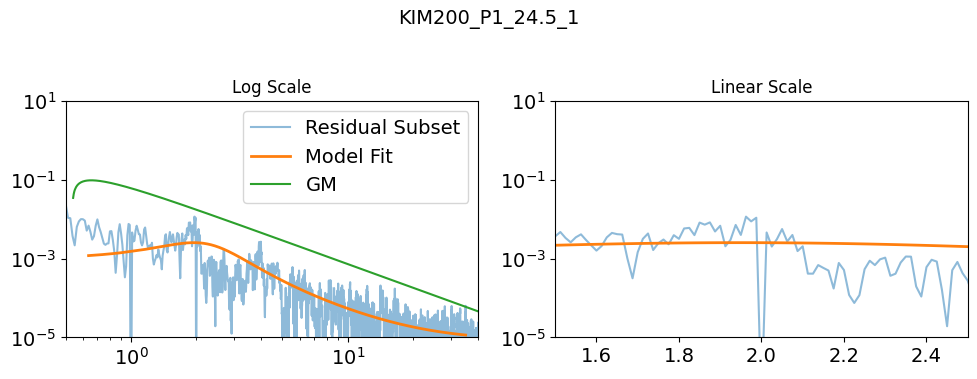

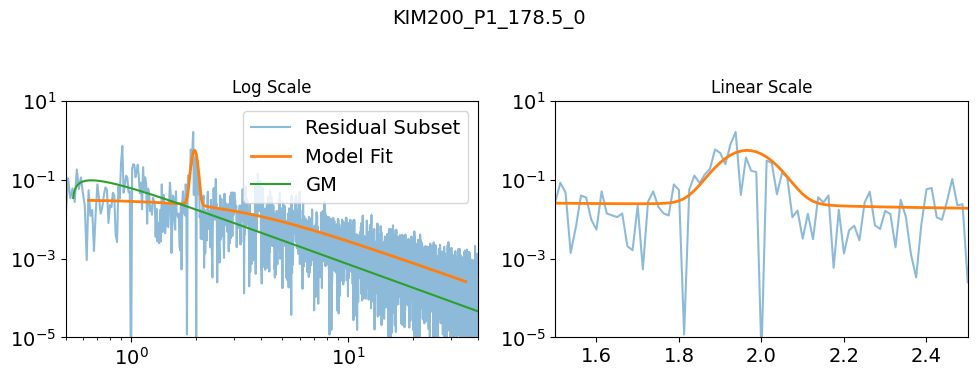

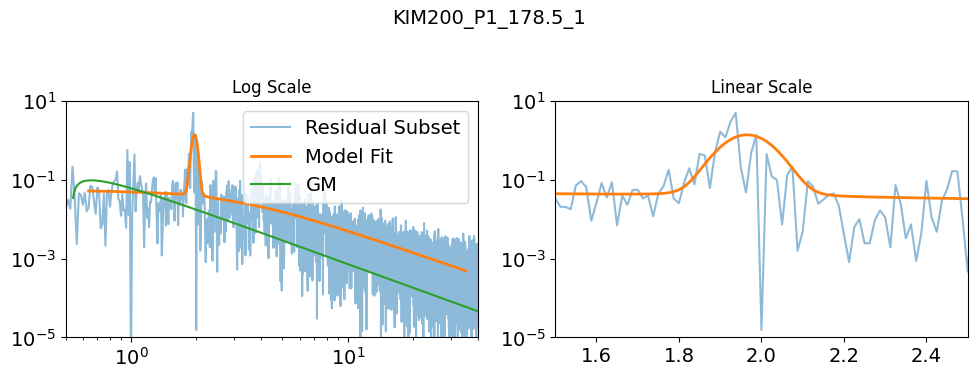

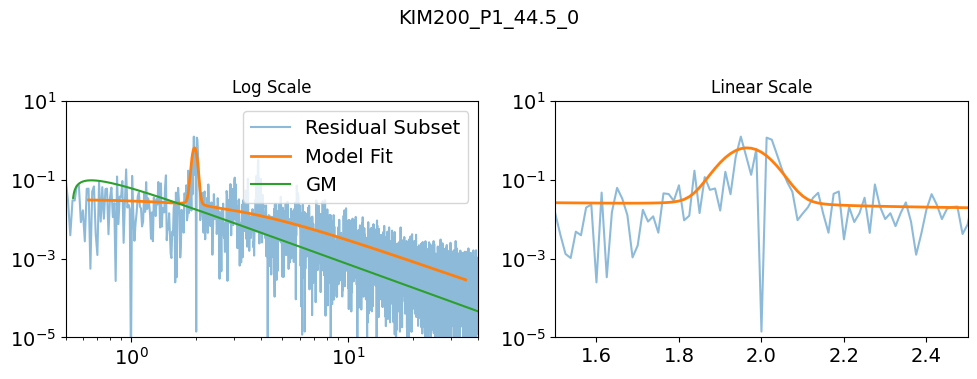

...

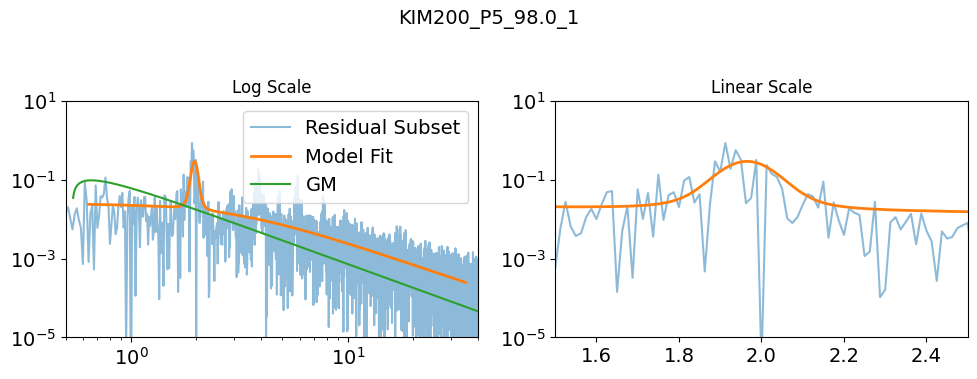

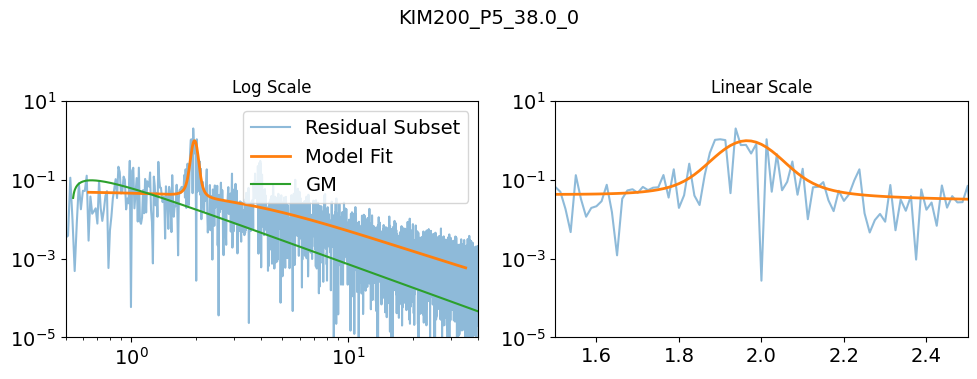

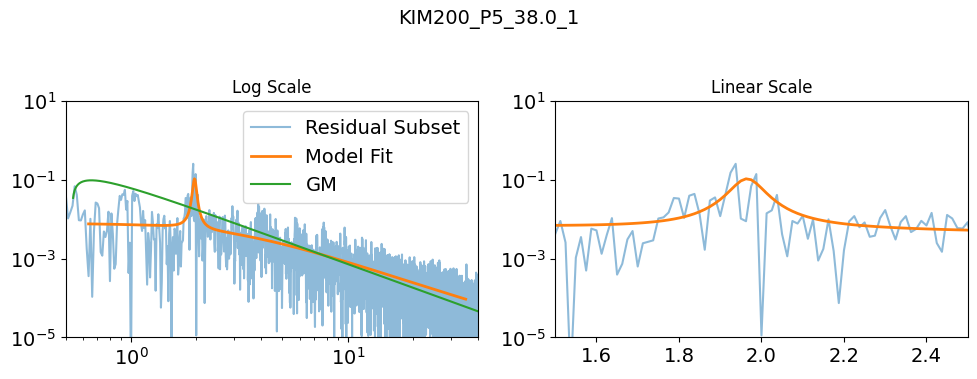

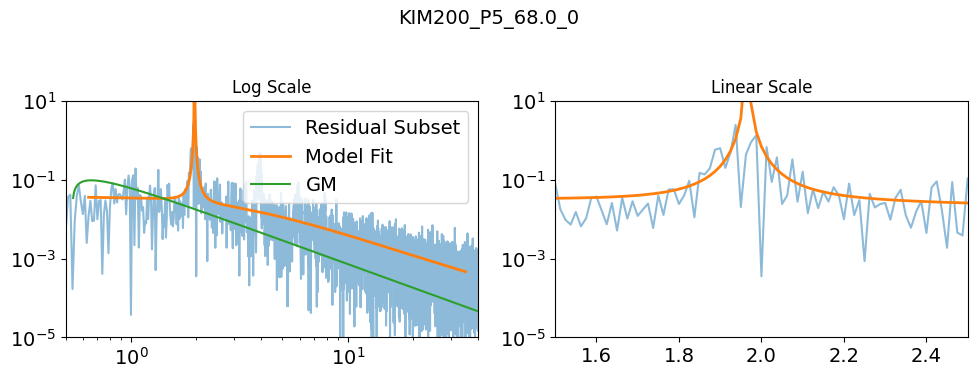

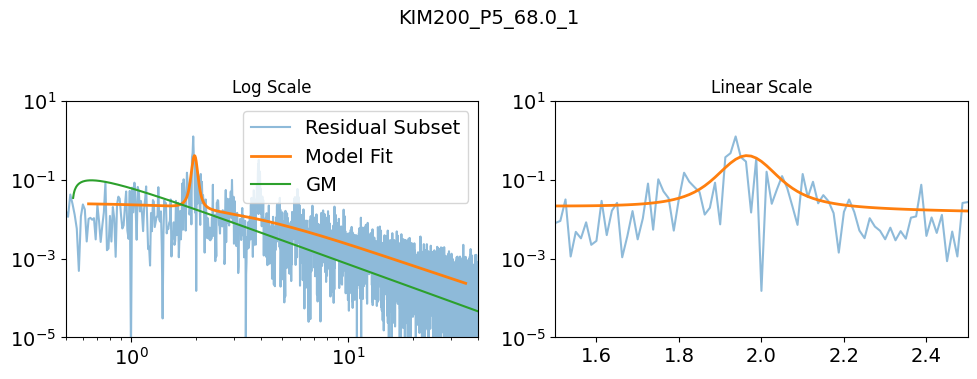

In [64]:
importlib.reload(Plot_figure)
Plot_figure.plot_model_fit(Whole_F_ε_dict,Whole_Puu_ϵ_dict,omg*86400, GM_spectrum/86400,
               F_model_fit_dict, P_model_fit_dict)

In [65]:
# extract an example of model fits
import pickle
# Define example names
example_names = ['KIM200_P3_79.0_0', 'KIM200_P3_109.0_0', 'KIM200_P3_159.0_0']
# Create data dictionary in a single step
data = {'Sorted_Depths': [name.split('_')[2] for name in example_names],
    'F_obs': [Whole_F_ε_dict[name] for name in example_names],
    'P_obs': [Whole_Puu_ε_dict[name] for name in example_names],
    'F_model_fit': [F_model_fit_dict[name] for name in example_names],
    'P_model_fit': [P_model_fit_dict[name] for name in example_names],
    'Mean_params': [Whole_Mean_params_dict[name] for name in example_names],
    'F_gm': omg * 86400,
    'P_gm': GM_spectrum / 86400,}
# Save the data
with open('KIM200_model_fit_P3 M1L1.pkl', 'wb') as f:
    pickle.dump(data, f)

# Construct the final df

In [256]:
importlib.reload(Processing)
Final_df = Processing.Construct_soln_df_from_dict(Time_summary_dict,Var_summary_dict,Avg_temp_dict,Soln_model_fit_dict,Whittle_value_dict,M1L1_parameter_name)
Final_df.to_csv('KIM200 M1L1 Model fit parameters.csv', index=False)
Final_df

,Dict_name,Year,Start_date,End_date,mean_temp,Whole_HA_var,HA_D1_var,HA_D2_var,Var_total,Var_subtidal,...,Var_model_fit,Whittle_value,η_c,α_c,η_D2,τ_D2,γ_D2,Site,Depth,season
0,KIM200_P1_104.5_0,2012,2012-02-02,2012-04-22,23.874641,0.198587,0.013051,0.189739,0.725230,0.278527,...,0.175689,-17017.366236,0.409528,1.007349,0.223033,3.101376,2.000000,KIM200,104.5,Feb-Apr
1,KIM200_P1_114.5_0,2012,2012-02-02,2012-04-22,23.362878,0.187406,0.014794,0.176356,0.782975,0.355449,...,0.165881,-17047.129364,0.389956,0.960899,0.228729,3.225401,2.000000,KIM200,114.5,Feb-Apr
2,KIM200_P1_129.5_0,2012,2012-02-02,2012-04-22,22.571126,0.187897,0.017466,0.173891,0.996132,0.538052,...,0.189147,-16646.689650,0.426234,0.976027,0.230553,3.614957,2.000000,KIM200,129.5,Feb-Apr
3,KIM200_P1_154.5_0,2012,2012-02-02,2012-04-22,21.072116,0.262491,0.028362,0.238451,1.636048,0.995049,...,0.270561,-15738.656286,0.498883,0.965758,0.290766,3.119853,2.000000,KIM200,154.5,Feb-Apr
4,KIM200_P1_178.5_0,2012,2012-02-02,2012-04-22,19.493510,0.467091,0.061220,0.412847,1.978949,0.984419,...,0.377531,-15191.683956,0.556912,0.975245,0.381341,4.363770,2.000000,KIM200,178.5,Feb-Apr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,KIM200_P5_58.0_1,2014,2014-04-22,2014-07-11,27.958529,0.138866,0.016062,0.128009,1.049125,0.601732,...,0.242822,-15946.867903,0.463657,0.924472,0.289282,5.747791,1.391633,KIM200,58.0,May-Jul
132,KIM200_P5_68.0_1,2014,2014-04-22,2014-07-11,27.520590,0.232467,0.019676,0.221465,1.045603,0.443764,...,0.292595,-15605.687726,0.505133,0.964897,0.318173,4.511803,1.407551,KIM200,68.0,May-Jul
133,KIM200_P5_78.0_1,2014,2014-04-22,2014-07-11,26.991379,0.312591,0.021014,0.303329,1.088625,0.360308,...,0.310705,-15188.711144,0.523855,0.906710,0.330551,5.015528,1.018141,KIM200,78.0,May-Jul
134,KIM200_P5_88.0_1,2014,2014-04-22,2014-07-11,26.402257,0.360075,0.019425,0.352930,1.049402,0.293653,...,0.292740,-15157.565623,0.518827,0.904807,0.305898,4.792169,1.030421,KIM200,88.0,May-Jul


In [228]:
importlib.reload(Processing)
len(Final_df.loc[Processing.Find_γ_close_to_boundary(Final_df,Bound_gamma,)])

41